# 5450Math Project

Tianyao Pu  A19575843
Tianyu Wang A19643014
Hanlin Wang A19502107

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker 
import pycountry_convert as pc
import folium
import branca
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import json, requests
import calmap
from plotcovid19 import *

In [3]:
pwd

'/Users/wanghanlin/Desktop/5450project'

In [4]:
df_countries_cases=pd.read_csv('df_countries_cases.csv',index_col=0)

In [5]:
df_countries_cases.head()

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Cases_28_Days,Deaths_28_Days
country,,,,,,,
Afghanistan,157431,7312,0.0,0.0,404.412302,1020,27
Albania,201402,3109,0.0,0.0,6998.471054,13051,160
Algeria,211112,6089,0.0,0.0,481.429826,4117,150
Andorra,18010,132,0.0,0.0,23309.389763,2392,2
Angola,65223,1735,0.0,0.0,198.449669,611,16


In [6]:
df_continents_cases=pd.read_csv('df_continents_cases.csv',index_col=0)

In [7]:
df_continents_cases.head()

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Cases_28_Days,Deaths_28_Days
continent,,,,,,,
Africa,8703463,223324,0.0,0.0,88209.885423,176105,4111
Asia,81564695,1200665,0.0,0.0,235239.675697,2478128,39263
Australia,316658,3334,0.0,0.0,7419.658024,46804,417
Europe,75915037,1432628,0.0,0.0,531395.842250,9303101,107642
North America,58596234,1177851,0.0,0.0,132967.338364,2781112,41153


In [8]:
df_confirmed = pd.read_csv('df_confirmed.csv',index_col=0)

In [9]:
df_confirmed.head()

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,11/24/21,11/25/21,11/26/21,11/27/21,11/28/21,11/29/21,11/30/21,12/1/21,12/2/21,12/3/21
0,NaN,Afghanistan,Asia,33.93911,67.709953,0,0,0,0,0,...,157032,157144,157171,157190,157218,157260,157289,157359,157387,157412
1,NaN,Albania,Europe,41.15330,20.168300,0,0,0,0,0,...,197776,198292,198732,199137,199555,199750,199945,200173,200639,201045
2,NaN,Algeria,Africa,28.03390,1.659600,0,0,0,0,0,...,209463,209624,209817,209980,210152,210344,210531,210723,210921,211112
3,NaN,Andorra,Europe,42.50630,1.521800,0,0,0,0,0,...,16426,16566,16712,16712,16712,16712,17115,17426,17658,18010
4,NaN,Angola,Africa,-11.20270,17.873900,0,0,0,0,0,...,65080,65105,65130,65139,65144,65155,65168,65183,65208,65223


In [10]:
df_deaths = pd.read_csv('df_deaths.csv',index_col=0)

In [11]:
df_deaths.head()

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,11/24/21,11/25/21,11/26/21,11/27/21,11/28/21,11/29/21,11/30/21,12/1/21,12/2/21,12/3/21
0,NaN,Afghanistan,Asia,33.93911,67.709953,0,0,0,0,0,...,7306,7307,7307,7308,7308,7308,7308,7309,7310,7311
1,NaN,Albania,Europe,41.15330,20.168300,0,0,0,0,0,...,3063,3068,3077,3085,3089,3092,3096,3101,3104,3108
2,NaN,Algeria,Africa,28.03390,1.659600,0,0,0,0,0,...,6035,6041,6046,6052,6058,6064,6071,6076,6083,6089
3,NaN,Andorra,Europe,42.50630,1.521800,0,0,0,0,0,...,131,131,131,131,131,131,131,131,132,132
4,NaN,Angola,Africa,-11.20270,17.873900,0,0,0,0,0,...,1731,1732,1733,1733,1733,1733,1733,1735,1735,1735


In [12]:
df_table = pd.read_csv('df_table.csv',index_col=0)

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [13]:
df_table.head()


,Country_Region,continent,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String,Delta_Deaths
0,Afghanistan,Asia,2020-01-22,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/22,0.0
1,Afghanistan,Asia,2020-01-23,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/23,0.0
2,Afghanistan,Asia,2020-01-24,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/24,0.0
3,Afghanistan,Asia,2020-01-25,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/25,0.0
4,Afghanistan,Asia,2020-01-26,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/26,0.0


In [14]:
temp_df = pd.DataFrame(df_countries_cases['Confirmed'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df["Confirmed"]), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Confirmed"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Confirmed Cases Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Confirmed Cases(Log Scale)",colorscale="purples")
# fig.to_image("Global Heat Map confirmed.png")
fig.show()

Q1 and Q2

In [41]:
df_confirmed_daily=df_confirmed.iloc[:,5:]

#df_confirmed[5:].diff(axis=1)

In [43]:
df_confirmed_daily1 = df_confirmed.iloc[:,:5]
df_confirmed_daily1.head()

,state,country,continent,Lat,Long
0,NaN,Afghanistan,Asia,33.93911,67.709953
1,NaN,Albania,Europe,41.15330,20.168300
2,NaN,Algeria,Africa,28.03390,1.659600
3,NaN,Andorra,Europe,42.50630,1.521800
4,NaN,Angola,Africa,-11.20270,17.873900


In [44]:
df_confirmed_daily=df_confirmed_daily.diff(axis=1)

In [45]:
df_confirmed_daily.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,11/24/21,11/25/21,11/26/21,11/27/21,11/28/21,11/29/21,11/30/21,12/1/21,12/2/21,12/3/21
0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.0,112.0,27.0,19.0,28.0,42.0,29.0,70.0,28.0,25.0
1,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,609.0,516.0,440.0,405.0,418.0,195.0,195.0,228.0,466.0,406.0
2,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,180.0,161.0,193.0,163.0,172.0,192.0,187.0,192.0,198.0,191.0
3,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,84.0,140.0,146.0,0.0,0.0,0.0,403.0,311.0,232.0,352.0
4,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,19.0,25.0,25.0,9.0,5.0,11.0,13.0,15.0,25.0,15.0


In [48]:
df_confirmed_daily2 = pd.concat([df_confirmed_daily1,df_confirmed_daily],axis=1)

In [49]:
df_confirmed_daily2.head(10)

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,11/24/21,11/25/21,11/26/21,11/27/21,11/28/21,11/29/21,11/30/21,12/1/21,12/2/21,12/3/21
0,NaN,Afghanistan,Asia,33.93911,67.709953,NaN,0.0,0.0,0.0,0.0,...,17.0,112.0,27.0,19.0,28.0,42.0,29.0,70.0,28.0,25.0
1,NaN,Albania,Europe,41.15330,20.168300,NaN,0.0,0.0,0.0,0.0,...,609.0,516.0,440.0,405.0,418.0,195.0,195.0,228.0,466.0,406.0
2,NaN,Algeria,Africa,28.03390,1.659600,NaN,0.0,0.0,0.0,0.0,...,180.0,161.0,193.0,163.0,172.0,192.0,187.0,192.0,198.0,191.0
3,NaN,Andorra,Europe,42.50630,1.521800,NaN,0.0,0.0,0.0,0.0,...,84.0,140.0,146.0,0.0,0.0,0.0,403.0,311.0,232.0,352.0
4,NaN,Angola,Africa,-11.20270,17.873900,NaN,0.0,0.0,0.0,0.0,...,19.0,25.0,25.0,9.0,5.0,11.0,13.0,15.0,25.0,15.0
5,NaN,Antigua and Barbuda,North America,17.06080,-61.796400,NaN,0.0,0.0,0.0,0.0,...,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
6,NaN,Argentina,South America,-38.41610,-63.616700,NaN,0.0,0.0,0.0,0.0,...,2234.0,2260.0,1912.0,1521.0,888.0,1968.0,2332.0,1881.0,2681.0,2382.0
7,NaN,Armenia,Asia,40.06910,45.038200,NaN,0.0,0.0,0.0,0.0,...,860.0,592.0,675.0,517.0,409.0,189.0,398.0,502.0,558.0,399.0
8,Australian Capital Territory,Australia,Australia,-35.47350,149.012400,NaN,0.0,0.0,0.0,0.0,...,8.0,8.0,7.0,7.0,7.0,6.0,4.0,8.0,4.0,7.0
9,New South Wales,Australia,Australia,-33.86880,151.209300,NaN,0.0,0.0,0.0,3.0,...,273.0,257.0,232.0,185.0,144.0,175.0,242.0,264.0,334.0,323.0


In [50]:
df_deaths_daily=df_deaths.iloc[:,5:]
df_deaths_daily=df_deaths_daily.diff(axis=1)
df_deaths_daily1=df_deaths.iloc[:,:5]
df_deaths_daily2 = pd.concat([df_deaths_daily1,df_deaths_daily],axis=1)

In [52]:
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["orange","blue"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","Daily Number of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
            # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        

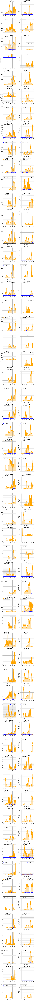

In [53]:
df_countries = df_confirmed.groupby(["country"]).sum()
df_countries = df_countries.sort_values(df_countries.columns[-1],ascending = False)
countries = df_countries[df_countries[df_countries.columns[-1]] >= 100000].index

cols =2
rows = int(np.ceil(countries.shape[0]/cols))
f = plt.figure(figsize=(20,9*rows))
for i,country in enumerate(countries):
    visualize_covid_cases(df_confirmed_daily2, df_deaths_daily2,country = country,figure = [f,rows,cols, i+1])

plt.show()

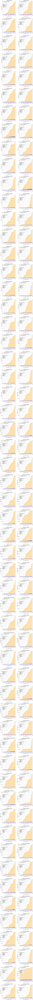

In [101]:
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["orange","blue"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Last week :\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-8])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Yesterday :\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","Total Number of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
            # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        


df_countries = df_confirmed.groupby(["country"]).sum()
df_countries = df_countries.sort_values(df_countries.columns[-1],ascending = False)
countries = df_countries[df_countries[df_countries.columns[-1]] >= 100000].index

cols =2
rows = int(np.ceil(countries.shape[0]/cols))
f = plt.figure(figsize=(20,9*rows))
for i,country in enumerate(countries):
    visualize_covid_cases(df_confirmed, df_deaths,country = country,figure = [f,rows,cols, i+1])

plt.show()

In [ ]:
Q3

In [125]:

import matplotlib.dates as mdates
import seaborn as sns

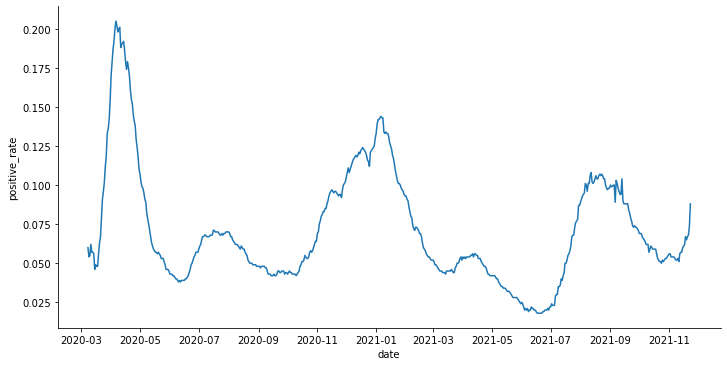

In [131]:
df_total = pd.read_csv('owid-covid-data.csv')

df_us = df_total.loc[df_total["location"] == "United States"]

df_us.to_csv("df_us.csv",index=False)


x = df_us['date']
x = pd.to_datetime(x)           


sns.relplot(
    data=df_us, 
    x=x, y="positive_rate", 
    kind="line",
    height=5, aspect=2
)

In [153]:
df_Canada = df_total.loc[df_total["location"] == "Canada"]
x = df_Canada['date']
x = pd.to_datetime(x)

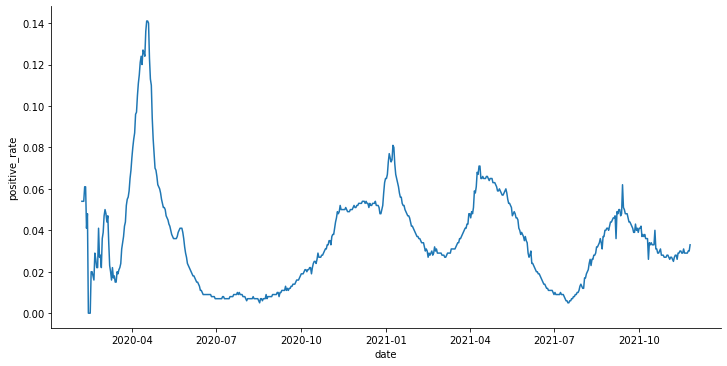

In [154]:
sns.relplot(
    data=df_Canada, 
    x=x, y="positive_rate", 
    kind="line",
    height=5, aspect=2
)

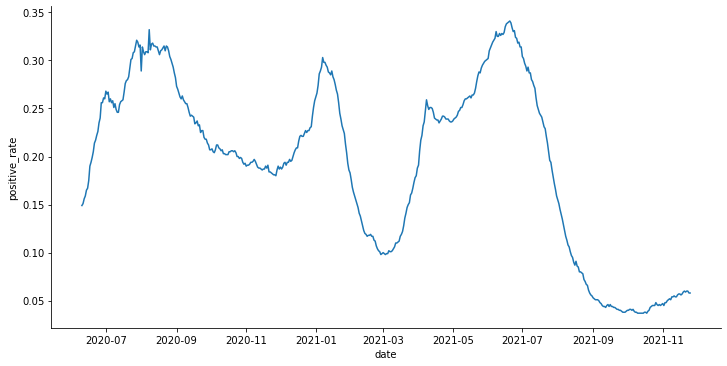

In [155]:
df_Colombia = df_total.loc[df_total["location"] == "Colombia"]
x = df_Colombia['date']
x = pd.to_datetime(x)
sns.relplot(
    data=df_Colombia, 
    x=x, y="positive_rate", 
    kind="line",
    height=5, aspect=2
)

Q4 and Q6

In [72]:
gdp = pd.read_csv("gdp_csv.csv")
gdp.head()

,Unnamed: 0,Country Name,Country Code,Year,Value
0,2306,Afghanistan,AFG,1960,5.377778e+08
1,2307,Afghanistan,AFG,1961,5.488889e+08
2,2308,Afghanistan,AFG,1962,5.466667e+08
3,2309,Afghanistan,AFG,1963,7.511112e+08
4,2310,Afghanistan,AFG,1964,8.000000e+08


In [73]:
import geopandas
import pycountry


import seaborn as sns



In [74]:
annotations = []
fig = px.scatter(df_country, x="Year", y="Value", color="Country Name",hover_name="Country Name")
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='GDP',
                              font=dict(family='Arial',
                                        size=30),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig.show()


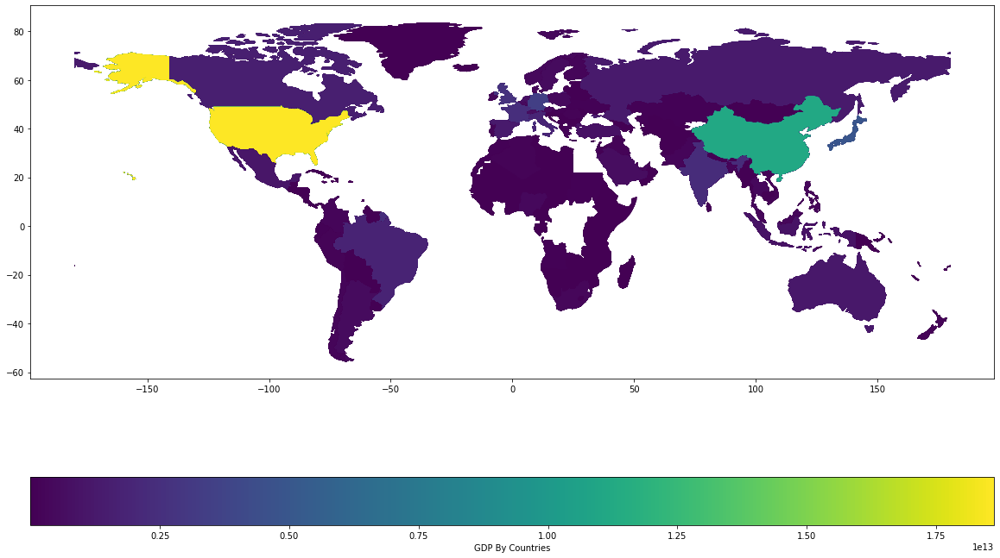

In [77]:
world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))

df_country_final = world.merge(df_country, how="left", left_on=['name'], right_on=['Country Name'])

df_country_final.isnull().sum()
df_country_final.shape

df_country_final.plot('Value',figsize=(20,14),legend=True,
                           legend_kwds={"label":"GDP By Countries", "orientation":"horizontal"});




In [82]:
df_countries_cases

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Cases_28_Days,Deaths_28_Days
country,,,,,,,
Afghanistan,157431,7312,0.0,0.0,404.412302,1020,27
Albania,201402,3109,0.0,0.0,6998.471054,13051,160
Algeria,211112,6089,0.0,0.0,481.429826,4117,150
Andorra,18010,132,0.0,0.0,23309.389763,2392,2
Angola,65223,1735,0.0,0.0,198.449669,611,16
...,...,...,...,...,...,...,...
Vietnam,1294778,26061,0.0,0.0,1330.179627,327233,3446
West Bank and Gaza,461467,4810,0.0,0.0,9045.860992,6368,105
Yemen,10021,1953,0.0,0.0,33.598239,177,47


In [86]:
df_countries_cases1 = df_countries_cases.loc[['Canada','USA','Mexico','Chile']]

In [87]:
df_countries_cases1.head()

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Cases_28_Days,Deaths_28_Days
country,,,,,,,
Canada,1813304,29819,0.0,0.0,4741.146472,74861,626
USA,49026566,787932,0.0,0.0,14880.601910,2533586,32679
Mexico,3897452,294904,0.0,0.0,3049.833540,79236,5773
Chile,1770620,38465,0.0,0.0,9262.401347,64758,625


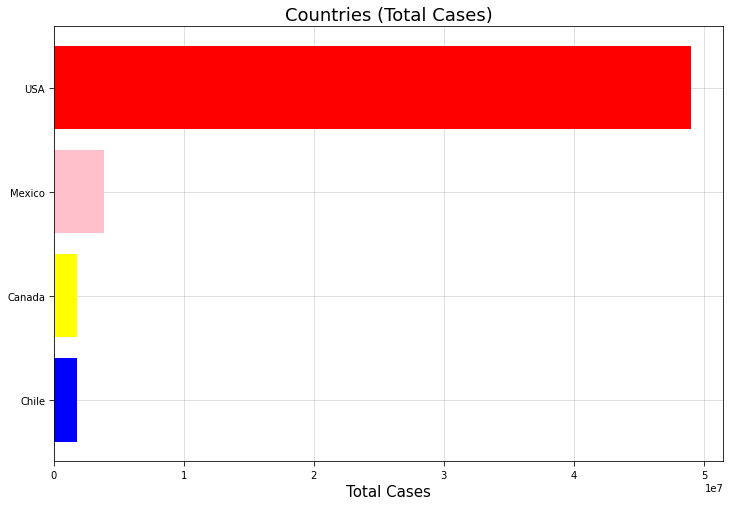

In [96]:
colors1 = ['blue', 'yellow','pink','red']
f = plt.figure(figsize=(12,8))
f.add_subplot(111)

plt.axes(axisbelow=True)
#plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[:],df_countries_cases.sort_values('Confirmed')["Confirmed"].index[:],color=colors)
plt.barh(df_countries_cases1.sort_values('Confirmed')["Confirmed"].index[-4:],df_countries_cases1.sort_values('Confirmed')["Confirmed"].values[-4:],color=colors1)
plt.tick_params(size=5,labelsize = 10)
plt.tick_params(size=5,labelsize = 10)
plt.xlabel("Total Cases",fontsize=15)
plt.title("Countries (Total Cases)",fontsize=18)
plt.grid(alpha=0.5)

Q6

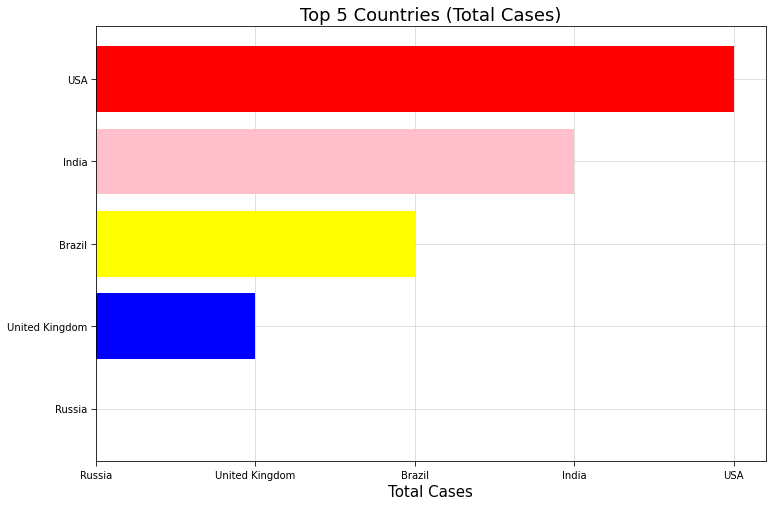

In [94]:
colors = [ 'green','blue', 'yellow','pink','red']
f = plt.figure(figsize=(12,8))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-5:],df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-5:],color=colors)
plt.tick_params(size=5,labelsize = 10)
plt.tick_params(size=5,labelsize = 10)
plt.xlabel("Total Cases",fontsize=15)
plt.title("Top 5 Countries (Total Cases)",fontsize=18)
plt.grid(alpha=0.5)

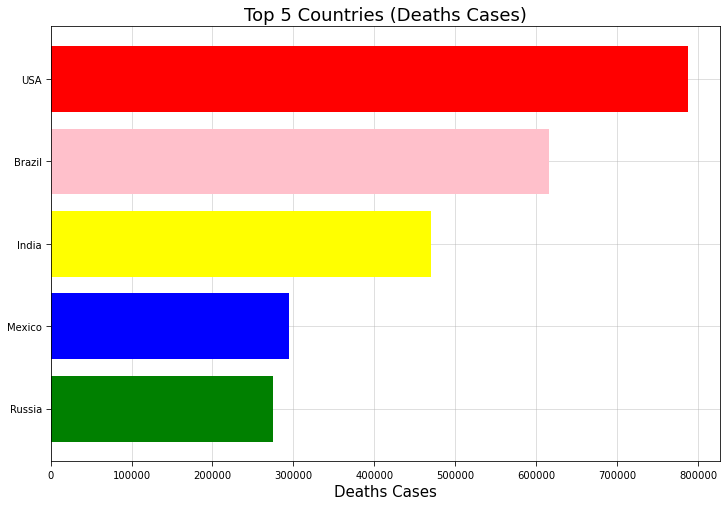

In [123]:
f = plt.figure(figsize=(12,8))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-5:],df_countries_cases.sort_values('Deaths')["Deaths"].values[-5:],color=colors)
plt.tick_params(size=5,labelsize = 10)
plt.xlabel("Deaths Cases",fontsize=15)
plt.title("Top 5 Countries (Deaths Cases)",fontsize=18)
plt.grid(alpha=0.5,which='both')

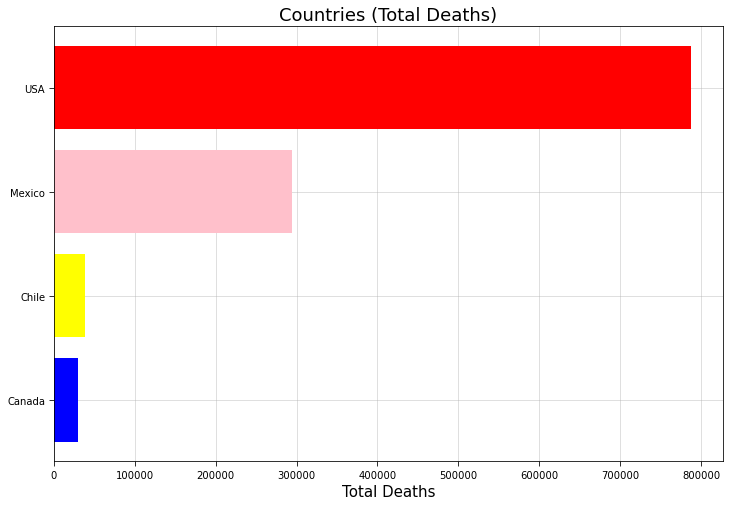

In [97]:



colors1 = ['blue', 'yellow','pink','red']
f = plt.figure(figsize=(12,8))
f.add_subplot(111)

plt.axes(axisbelow=True)
#plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[:],df_countries_cases.sort_values('Confirmed')["Confirmed"].index[:],color=colors)
plt.barh(df_countries_cases1.sort_values('Deaths')["Deaths"].index[-4:],df_countries_cases1.sort_values('Deaths')["Deaths"].values[-4:],color=colors1)
plt.tick_params(size=5,labelsize = 10)
plt.tick_params(size=5,labelsize = 10)
plt.xlabel("Total Deaths",fontsize=15)
plt.title("Countries (Total Deaths)",fontsize=18)
plt.grid(alpha=0.5)

Q5

<AxesSubplot:>

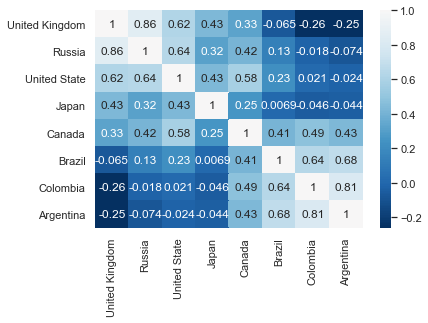

In [24]:
data3 = pd.read_csv("data3.csv")
corr = data3.corr()
sns.heatmap(corr,cmap= "RdBu_r",center= 1, annot= True)

Q7

In [15]:
hdidata=pd.read_csv("hdidata.csv")

In [16]:
hdidata.head()

,No.,Country name,HDI,Life expectancy at birth,Expected years of schooling,Mean years of schooling,Gross national income (GNI) per capita,GNI per capita rank minus HDI rank,HDI rank,Region
0,1,Norway,0.957,82.40,18.06615,12.897750,66494.25217,7,1,Europe
1,2,Ireland,0.955,82.31,18.70529,12.666330,68370.58737,4,3,Europe
2,2,Switzerland,0.955,83.78,16.32844,13.380812,69393.52076,3,2,Europe
3,4,"Hong Kong, China (SAR)",0.949,84.86,16.92947,12.279960,62984.76553,7,4,Asia & Pacific
4,4,Iceland,0.949,82.99,19.08309,12.772787,54682.38057,14,4,Europe


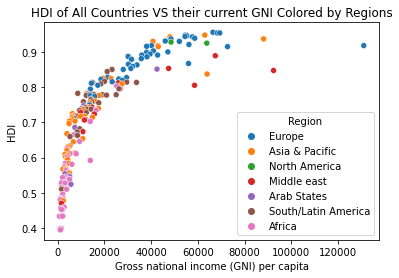

In [18]:
import seaborn as sns
sns.scatterplot(data=hdidata, x="Gross national income (GNI) per capita",y='HDI',hue = 'Region',legend = True,alpha= 1).set_title('HDI of All Countries VS their current GNI Colored by Regions')

plt.show()


Q8

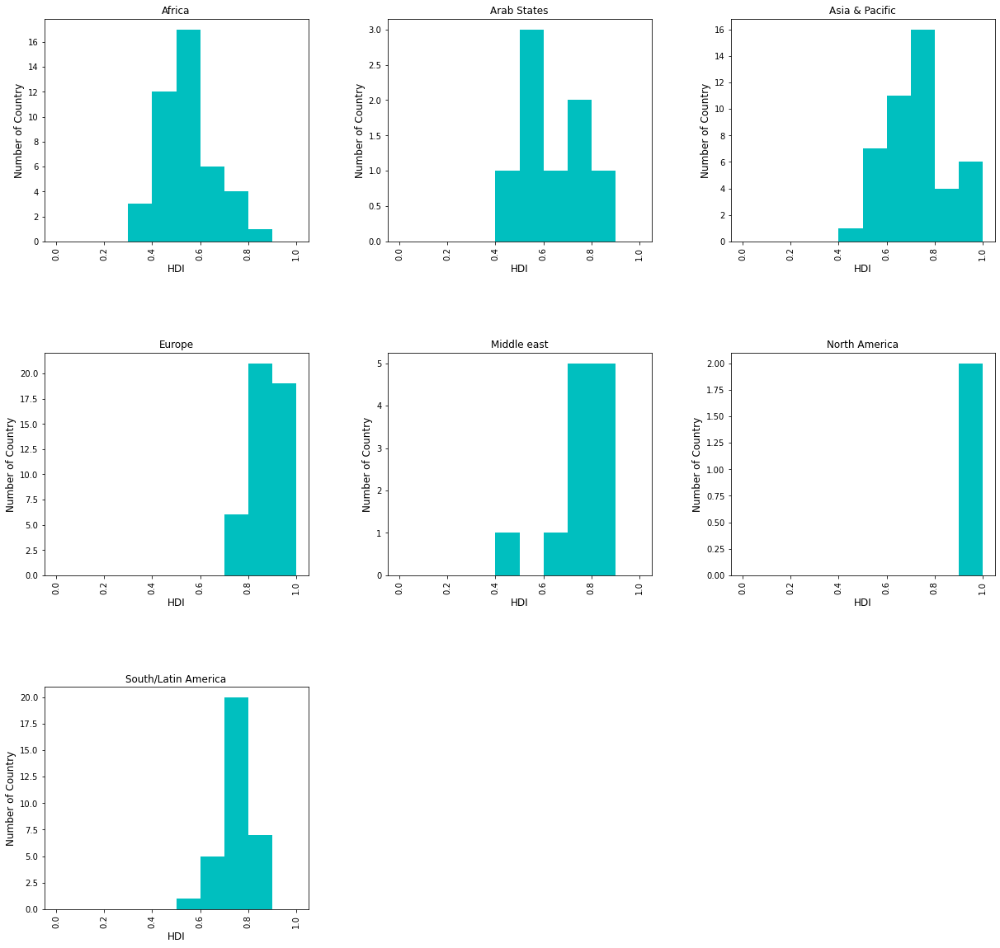

In [19]:
axarr = hdidata.hist(column="HDI",range=[0,1],by='Region',figsize=(20,20),color='c')
for ax in axarr.flatten():
    ax.set_xlabel("HDI",fontsize = 12)
    ax.set_ylabel("Number of Country",fontsize = 12)

plt.show()

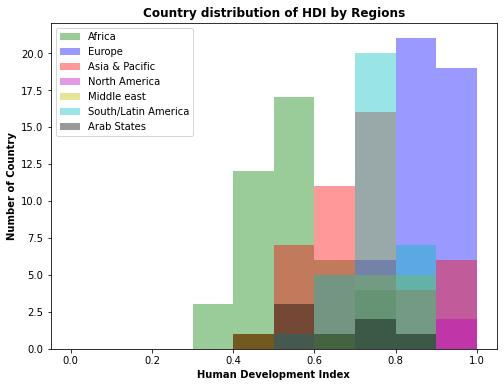

In [20]:
Africa = hdidata.loc[hdidata.Region =="Africa",'HDI']
EU = hdidata.loc[hdidata.Region =="Europe",'HDI']
AP = hdidata.loc[hdidata.Region =="Asia & Pacific",'HDI']
NA = hdidata.loc[hdidata.Region =="North America",'HDI']
ME = hdidata.loc[hdidata.Region =="Middle east",'HDI']
SL = hdidata.loc[hdidata.Region =="South/Latin America",'HDI']
Arab = hdidata.loc[hdidata.Region =="Arab States",'HDI']
plt.figure(figsize=(8,6))
plt.hist(Africa,range=[0,1],alpha=0.4, bins=10,color='g',label='Africa')
plt.hist(EU,range=[0,1],color='b',alpha=0.4, bins=10,label='Europe')
plt.hist(AP,range=[0,1],color='r',alpha=0.4, bins=10,label='Asia & Pacific')
plt.hist(NA,range=[0,1],color='m',alpha=0.4, bins=10,label='North America')
plt.hist(ME,range=[0,1],color='y',alpha=0.4, bins=10,label='Middle east')
plt.hist(SL,range=[0,1],color='c',alpha=0.4, bins=10,label='South/Latin America')
plt.hist(Arab,range=[0,1],color='k',alpha=0.4, bins=10,label='Arab States')
# plt.legend(loc='upper right')
plt.legend()
plt.title('Country distribution of HDI by Regions',fontweight="bold",fontsize = 12)
plt.xlabel('Human Development Index',fontweight="bold")
plt.ylabel('Number of Country',fontweight="bold")
plt.show()
# plt.savefig("Country distribution of HDI by Regions.png")

Q5

In [26]:
# hdibyregion=hdidata.drop(['HDI rank','GNI per capita rank minus HDI rank'],axis=1).groupby(["Region"]).mean()
hdidata_heatmap=hdidata.drop(['No.','HDI rank','GNI per capita rank minus HDI rank','Country name','Region'],axis=1)

In [27]:
hdidata_heatmap

,HDI,Life expectancy at birth,Expected years of schooling,Mean years of schooling,Gross national income (GNI) per capita
0,0.957,82.40,18.066150,12.897750,66494.252170
1,0.955,82.31,18.705290,12.666330,68370.587370
2,0.955,83.78,16.328440,13.380812,69393.520760
3,0.949,84.86,16.929470,12.279960,62984.765530
4,0.949,82.99,19.083090,12.772787,54682.380570
...,...,...,...,...,...
184,0.433,61.58,11.069330,3.287983,753.908748
185,0.433,57.85,5.296258,4.800000,2003.318894
186,0.398,54.24,7.349350,2.523680,1555.373575
187,0.397,53.28,7.568360,4.282000,993.008842


In [28]:
hdibyregion_heatmap=hdidata.drop(['HDI rank','GNI per capita rank minus HDI rank'],axis=1).groupby(["Region"]).mean()

In [29]:
corr_matrix = hdidata_heatmap.corr()
mask = np.zeros_like(corr_matrix, dtype=np.bool) # Make the matrix structure to be boolean type
mask[np.triu_indices_from(mask)]= True 
mask = np.zeros_like(corr_matrix, dtype=np.bool) # Make the matrix structure to be boolean type
mask[np.triu_indices_from(mask)]= True 

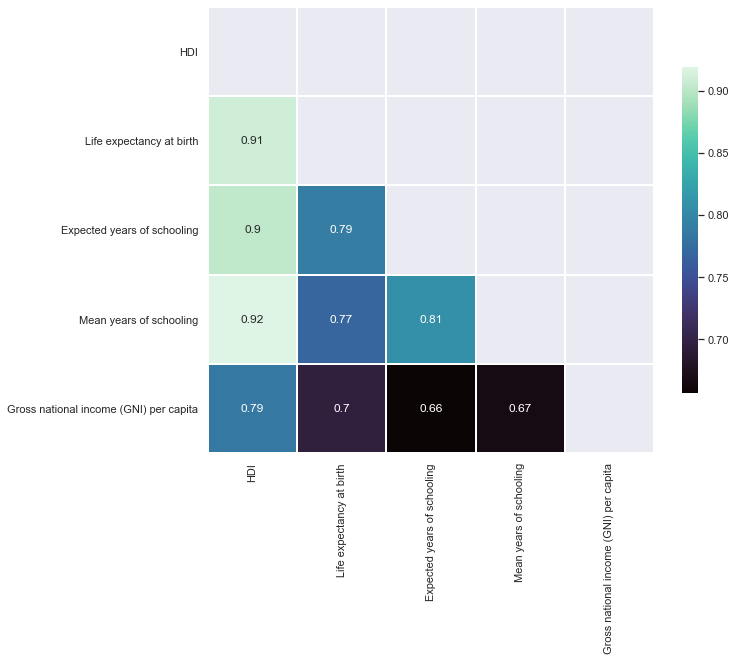

In [30]:
plt.subplots(figsize=(10, 10)) # set size of the plot

hdi_heatmap=sns.heatmap(corr_matrix, 
                      square = True, # square shape map
                        linewidths=1, # set lines width to split the squares
                        annot=True, # show correlation figures
                    annot_kws = {'size':12}, # correlation figures' size
                        cbar_kws={"shrink":0.6}, # set color bar size
                        cmap="mako", # set heatmap color style
                        mask = mask) # apply the mask to the heatmap(hide uptriangle)

#add the column names as labels
# ax.set_yticklabels(corr_matrix.columns, rotation = 0)
# ax.set_xticklabels(corr_matrix.columns)
sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

Q9

In [22]:

import statsmodels.api as sm
import pandas as pd
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()
'''
regression equation：
Life expectancy at birth = β1 + β2*Expected years of schooling 
                           + β3*Mean years of schooling 
                           + β4*Gross national income (GNI) per capita
we wish at least one of the coef is non-zero
null hypothesis: β2 = β3 = β4 = 0
'''
dataHDI = pd.read_csv("hdidata.csv")
y = dataHDI["Life expectancy at birth"]
ES = dataHDI["Expected years of schooling"]
MS = dataHDI["Mean years of schooling"]
GNI = dataHDI["Gross national income (GNI) per capita"]
x = dataHDI[["Expected years of schooling","Mean years of schooling","Gross national income (GNI) per capita"]]
x=sm.add_constant(x) #add constant
LR2 = sm.OLS(y,x)
LR2 = LR2.fit()
LR2.summary()
print('Parameters: ', LR2.params)
'''
Life expectancy at birth = 51.6531 + 1.0148*Expected years of schooling 
                           + 0.6659*Mean years of schooling 
                           + 0.000085*Gross national income (GNI) per capita

'''





Parameters:  const                                     51.653087
Expected years of schooling                1.014780
Mean years of schooling                    0.665901
Gross national income (GNI) per capita     0.000085
dtype: float64


'\nLife expectancy at birth = 51.6531 + 1.0148*Expected years of schooling \n                           + 0.6659*Mean years of schooling \n                           + 0.000085*Gross national income (GNI) per capita\n\n'

<AxesSubplot:>

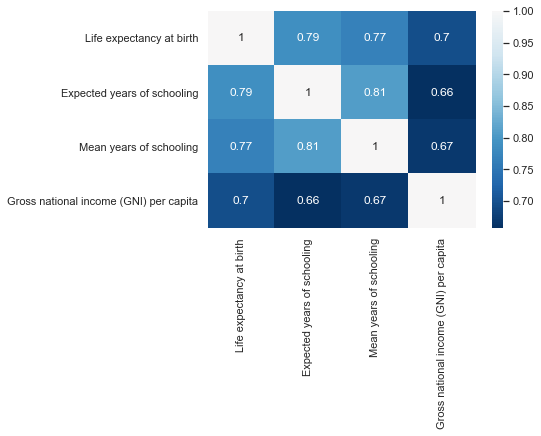

In [23]:
# p-value<0.05, reject null hypothesis
# F-statistic: 191.3, which is far from 1, so we reject null hypothesis
dataHDI2 = dataHDI[["Life expectancy at birth","Expected years of schooling","Mean years of schooling","Gross national income (GNI) per capita"]]
corr = dataHDI2.corr()
sns.heatmap(corr,cmap= "RdBu_r",center= 1,annot= True)